In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import pickle
import seaborn as sns
import pandas as pd

from sklearn.svm import SVC
from sklearn.cluster import MiniBatchKMeans
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import StratifiedKFold
from collections import defaultdict
from skimage.feature import hog, local_binary_pattern
from sklearn.model_selection import train_test_split

# Bisindo Sign Language Classification

This notebook implements a hand gesture classification system using:
1. **Various Descriptors** - SIFT, RootSIFT, Akaze, ORB, HOG, LBP
2. **Bag of Visual Words (BoVW)** - Feature encoding using K-Means clustering
3. **Support Vector Classifier (SVC)** - Multi-class classification

## Classes
- A - Z

In [ ]:
DATA_PATH = 'dataset'
CLASSES = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']
NUM_CLASSES = len(CLASSES)

N_CLUSTERS = 100  
MAX_FEATURES = 150 
TEST_SIZE = 0.2
RANDOM_STATE = 67

## 1. Define descriptors

In [110]:
class RootSIFT:
    def __init__(self, sift=None):
        self.sift = sift

    def detectAndCompute(self, image, param):
        keypoints, descriptors = self.sift.detectAndCompute(image, None)

        if descriptors is None:
            return keypoints, None

        descriptors /= (np.linalg.norm(descriptors, ord=1, axis=1, keepdims=True) + 1e-7)
        descriptors = np.sqrt(descriptors)
        return keypoints, descriptors.astype(np.float32)

class HOGDescriptor:
    def __init__(self, orientations=9, pixels_per_cell=(32, 32), cells_per_block=(2, 2)):
        self.orientations = orientations
        self.pixels_per_cell = pixels_per_cell
        self.cells_per_block = cells_per_block
    
    def compute(self, image):
        features = hog(image, orientations=self.orientations,
                      pixels_per_cell=self.pixels_per_cell,
                      cells_per_block=self.cells_per_block,
                      block_norm='L2-Hys', feature_vector=True)
        return features.astype(np.float32)

class LBPDescriptor:
    def __init__(self, radius=3, n_points=24):
        self.radius = radius
        self.n_points = n_points
    
    def compute(self, image):
        lbp = local_binary_pattern(image, self.n_points, self.radius, method='uniform')
        n_bins = self.n_points + 2
        hist, _ = np.histogram(lbp.ravel(), bins=n_bins, range=(0, n_bins), density=True)
        return hist.astype(np.float32)

sift = cv2.SIFT_create(nfeatures=MAX_FEATURES)
rootsift = RootSIFT(sift=sift)
akaze = cv2.AKAZE_create()
orb = cv2.ORB_create(nfeatures=MAX_FEATURES)
hog_desc = HOGDescriptor()
lbp_desc = LBPDescriptor()

## 2. Load Dataset

In [111]:
def load_images(folder):
    images = []
    for f in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, f))
        images.append(img)
    return images

images, labels = [], []
for idx, cls in enumerate(CLASSES):
    class_imgs = load_images(os.path.join(DATA_PATH, cls))
    images.extend(class_imgs)
    labels.extend([idx] * len(class_imgs))
    print(f"{cls}: {len(class_imgs)} images")

print(f"\nTotal: {len(images)} images")

A: 20 images
B: 20 images
C: 20 images
D: 20 images
E: 20 images
F: 20 images
G: 20 images
H: 20 images
I: 20 images
J: 20 images
K: 20 images
L: 20 images
M: 20 images
N: 20 images
O: 20 images
P: 20 images
Q: 20 images
R: 20 images
S: 20 images
T: 20 images
U: 20 images
V: 20 images
W: 20 images
X: 20 images
Y: 20 images
Z: 20 images

Total: 520 images


## 3. Preprocess Image

In [112]:
def resize_image(img, target_size=(256, 256)):
    return cv2.resize(img, target_size)

In [113]:
resized_images = []

for img in tqdm(images, desc="Resizing"):
    resized_img = resize_image(img)
    resized_images.append(resized_img)

Resizing: 100%|██████████| 520/520 [02:24<00:00,  3.61it/s]


In [ ]:
def augment_image(img):
    augmented = [img]
    h, w = img.shape[:2]
    center = (w // 2, h // 2)

    # 1. Horizontal flip
    augmented.append(cv2.flip(img, 1))

    # 2. Rotation (-15°, +15°)
    for angle in [-15, -10, 10, 15]:
        M = cv2.getRotationMatrix2D(center, angle, 1.0)
        rotated = cv2.warpAffine(
            img, M, (w, h),
            borderMode=cv2.BORDER_REFLECT
        )
        augmented.append(rotated)

    # 3. Brightness & Contrast
    for alpha, beta in [(0.7, 0), (1.3, 0), (1.1, 10), (0.9, -10)]:
        adjusted = cv2.convertScaleAbs(img, alpha=alpha, beta=beta)
        augmented.append(adjusted)

    # 4. Gaussian Blur (camera focus variation)
    for k in [3, 5]:
        blurred = cv2.GaussianBlur(img, (k, k), 0)
        augmented.append(blurred)

    # 5. Gaussian Noise (sensor noise)
    noise = np.random.normal(0, 10, img.shape).astype(np.uint8)
    noisy = cv2.add(img, noise)
    augmented.append(noisy)

    # 6. Random Translation (small shift)
    for dx, dy in [(-10, 0), (10, 0), (0, -10), (0, 10)]:
        M = np.float32([[1, 0, dx], [0, 1, dy]])
        shifted = cv2.warpAffine(
            img, M, (w, h),
            borderMode=cv2.BORDER_REFLECT
        )
        augmented.append(shifted)

    # 7. Zoom (scale in / out)
    for scale in [0.9, 1.1]:
        M = cv2.getRotationMatrix2D(center, 0, scale)
        zoomed = cv2.warpAffine(
            img, M, (w, h),
            borderMode=cv2.BORDER_REFLECT
        )
        augmented.append(zoomed)

    return augmented


In [ ]:
all_images = resized_images.copy()
all_labels = labels.copy()

Total original images: 520 (augmentation will be applied during training)


In [116]:
def preprocess_image(img):
    if img is None:
        return None
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray_blur = cv2.GaussianBlur(gray, (3, 3), 0)
    return gray_blur

In [ ]:
preprocessed_images = []

for img in tqdm(all_images, desc="Preprocessing"):
    preprocessed_img = preprocess_image(img)
    preprocessed_images.append(preprocessed_img)

print(f"Total preprocessed images: {len(preprocessed_images)}")

Preprocessing: 100%|██████████| 520/520 [00:00<00:00, 2173.44it/s]

Total preprocessed images: 520


In [118]:
len(preprocessed_images)

520

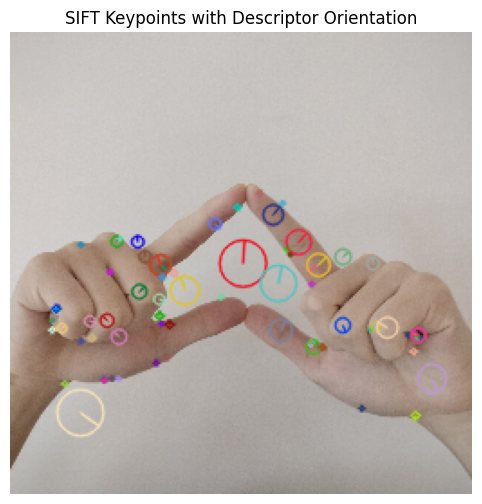

In [119]:
kps, prep = rootsift.detectAndCompute(all_images[0 ], None)

img_test = cv2.drawKeypoints(all_images[0 ], kps, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(8, 6))
plt.imshow(cv2.cvtColor(img_test, cv2.COLOR_BGR2RGB))
plt.title("SIFT Keypoints with Descriptor Orientation")
plt.axis('off')
plt.show()

In [120]:
def extract_features(images, descriptor):
  descriptors_list = []

  for img in tqdm(images, desc="Extracting features"):
    _, desc = descriptor.detectAndCompute(img, None)
    descriptors_list.append(desc)
  return descriptors_list

In [123]:
def create_histogram(descriptors, kmeans, n_clusters):
    if descriptors is None:
        return np.zeros(n_clusters)
    words = kmeans.predict(descriptors)
    hist, _ = np.histogram(words, bins=range(n_clusters + 1))
    return hist / (np.linalg.norm(hist) + 1e-7)

## 4. Split dataset

In [164]:
X_train, X_test, y_train, y_test = train_test_split(
    preprocessed_images, all_labels, 
    test_size=0.2, 
    stratify=all_labels, 
    random_state=RANDOM_STATE
)
print(f"Train X: {len(X_train)}")
print(f"Test X: {len(X_test)}")

Train X: 416
Test X: 104


## 5. Cross-Validation Training with Sample Size Analysis

### Configuration
- **K-Fold Cross-Validation**: 5 folds
- **Sample Sizes per Class**: 5, 10, 15, 18
- **Evaluation Metric**: Accuracy

In [178]:
K_FOLDS = 5
SAMPLE_SIZES = [5, 10, 15, 18]  

DESCRIPTORS = {
    'SIFT': {'type': 'keypoint', 'descriptor': sift},
    'RootSIFT': {'type': 'keypoint', 'descriptor': rootsift},
    'AKAZE': {'type': 'keypoint', 'descriptor': akaze},
    'ORB': {'type': 'keypoint', 'descriptor': orb},
    'HOG': {'type': 'global', 'descriptor': hog_desc},
    'LBP': {'type': 'global', 'descriptor': lbp_desc},
}

print(f"Cross-Validation Configuration:")
print(f"  K-Folds: {K_FOLDS}")
print(f"  Sample Sizes: {SAMPLE_SIZES}")
print(f"  Original images: {len(preprocessed_images)}")

Cross-Validation Configuration:
  K-Folds: 5
  Sample Sizes: [5, 10, 15, 18]
  Original images: 520


In [181]:
def extract_and_augment_fold(indices, images, labels, desc_type, desc_name, augment=True):
    fold_images = []
    fold_labels = []
    
    for idx in indices:
        img = images[idx]
        label = labels[idx]
        
        fold_images.append(img)
        fold_labels.append(label)
        
        if augment:
            augmented = augment_image(cv2.cvtColor(img, cv2.COLOR_GRAY2BGR))
            for aug_img in augmented[1:]:
                aug_gray = preprocess_image(aug_img)
                fold_images.append(aug_gray)
                fold_labels.append(label)
    
    if desc_type == 'keypoint':
        descriptor = DESCRIPTORS[desc_name]['descriptor']
        desc_list = []
        for img in fold_images:
            _, desc = descriptor.detectAndCompute(img, None)
            desc_list.append(desc)
        return desc_list, fold_labels
    else:
        descriptor = DESCRIPTORS[desc_name]['descriptor']
        features = np.array([descriptor.compute(img) for img in fold_images])
        return features, fold_labels


def train_with_proper_pipeline(images, labels, desc_name, sample_size, k_folds=5):
    desc_type = DESCRIPTORS[desc_name]['type']
    
    labels = np.array(labels)
    
    sampled_indices = []
    for cls in range(NUM_CLASSES):
        cls_indices = np.where(labels == cls)[0]
        n_samples = min(sample_size, len(cls_indices))
        selected = np.random.choice(cls_indices, size=n_samples, replace=False)
        sampled_indices.extend(selected)
    
    sampled_indices = np.array(sampled_indices)
    images = [images[i] for i in sampled_indices]
    labels = labels[sampled_indices]
    
    skf = StratifiedKFold(n_splits=k_folds, shuffle=True, random_state=RANDOM_STATE)
    fold_accuracies = []
    best_model = None
    best_scaler = None
    best_kmeans = None
    best_acc = 0.0
    
    for fold_idx, (train_idx, val_idx) in enumerate(skf.split(images, labels)):
        if desc_type == 'keypoint':
            train_desc_list, train_labels = extract_and_augment_fold(
                train_idx, images, labels, desc_type, desc_name, augment=True
            )
            val_desc_list, val_labels = extract_and_augment_fold(
                val_idx, images, labels, desc_type, desc_name, augment=False
            )
            
            all_train_desc = np.vstack([d for d in train_desc_list if d is not None])
            kmeans = MiniBatchKMeans(n_clusters=N_CLUSTERS, random_state=RANDOM_STATE, batch_size=1000)
            kmeans.fit(all_train_desc)
            
            X_train = np.array([create_histogram(d, kmeans, N_CLUSTERS) for d in train_desc_list])
            X_val = np.array([create_histogram(d, kmeans, N_CLUSTERS) for d in val_desc_list])
            y_train, y_val = np.array(train_labels), np.array(val_labels)
        else:
            X_train, train_labels = extract_and_augment_fold(
                train_idx, images, labels, desc_type, desc_name, augment=True
            )
            X_val, val_labels = extract_and_augment_fold(
                val_idx, images, labels, desc_type, desc_name, augment=False
            )
            y_train, y_val = np.array(train_labels), np.array(val_labels)
            kmeans = None
        
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_val_scaled = scaler.transform(X_val)
        
        svc = SVC(kernel='rbf', C=1.0, gamma='scale', probability=True,
                  class_weight='balanced', random_state=RANDOM_STATE)
        svc.fit(X_train_scaled, y_train)
        
        y_pred = svc.predict(X_val_scaled)
        accuracy = accuracy_score(y_val, y_pred)
        fold_accuracies.append(accuracy)
        
        if accuracy > best_acc:
            best_acc = accuracy
            best_model = svc
            best_scaler = scaler
            best_kmeans = kmeans
    
    return fold_accuracies, best_model, best_scaler, best_kmeans

## 6. Train

In [184]:
results = defaultdict(lambda: defaultdict(dict))
best_models = defaultdict(dict)

print("=" * 60)
print("K-Fold → Augment Training Only")
print("=" * 60)

for desc_name in DESCRIPTORS.keys():
    print(f"\n{'='*50}")
    print(f"Descriptor: {desc_name}")
    print(f"{'='*50}")
    
    for sample_size in SAMPLE_SIZES:
        print(f"\nSample size per class: {sample_size}")
        fold_accuracies, best_model, best_scaler, best_kmeans = train_with_proper_pipeline(
            X_train, y_train, desc_name, sample_size, k_folds=K_FOLDS
        )
        
        mean_acc = np.mean(fold_accuracies)
        std_acc = np.std(fold_accuracies)
        
        results[desc_name][sample_size] = {
            'fold_accuracies': fold_accuracies,
            'mean_accuracy': mean_acc,
            'std_accuracy': std_acc,
            'n_folds': len(fold_accuracies)
        }
        
        best_models[desc_name][sample_size] = {
            'model': best_model,
            'scaler': best_scaler,
            'kmeans': best_kmeans
        }
        
        print(f"  Mean Accuracy: {mean_acc:.4f} ± {std_acc:.4f}")
        print(f"  All folds: {[f'{acc:.4f}' for acc in fold_accuracies]}")

K-Fold → Augment Training Only

Descriptor: SIFT

Sample size per class: 5


c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y

  Mean Accuracy: 0.8462 ± 0.0421
  All folds: ['0.8462', '0.8077', '0.8462', '0.9231', '0.8077']

Sample size per class: 10
  Mean Accuracy: 0.9038 ± 0.0403
  All folds: ['0.8846', '0.8654', '0.8654', '0.9423', '0.9615']

Sample size per class: 15
  Mean Accuracy: 0.9308 ± 0.0276
  All folds: ['0.9744', '0.9231', '0.9487', '0.8974', '0.9103']

Sample size per class: 18
  Mean Accuracy: 0.9327 ± 0.0292
  All folds: ['0.9405', '0.9518', '0.8795', '0.9639', '0.9277']

Descriptor: RootSIFT

Sample size per class: 5


c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y

  Mean Accuracy: 0.8462 ± 0.0644
  All folds: ['0.8846', '0.7692', '0.9231', '0.7692', '0.8846']

Sample size per class: 10
  Mean Accuracy: 0.9346 ± 0.0396
  All folds: ['0.9808', '0.9808', '0.8846', '0.9231', '0.9038']

Sample size per class: 15
  Mean Accuracy: 0.9205 ± 0.0392
  All folds: ['0.9744', '0.8590', '0.9103', '0.9487', '0.9103']

Sample size per class: 18
  Mean Accuracy: 0.9351 ± 0.0224
  All folds: ['0.9405', '0.9157', '0.9639', '0.9518', '0.9036']

Descriptor: AKAZE

Sample size per class: 5


c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y

  Mean Accuracy: 0.8385 ± 0.0705
  All folds: ['0.8462', '0.7692', '0.8462', '0.7692', '0.9615']

Sample size per class: 10
  Mean Accuracy: 0.9038 ± 0.0385
  All folds: ['0.8462', '0.9038', '0.9615', '0.9231', '0.8846']

Sample size per class: 15
  Mean Accuracy: 0.9103 ± 0.0181
  All folds: ['0.8974', '0.9359', '0.8846', '0.9231', '0.9103']

Sample size per class: 18
  Mean Accuracy: 0.9086 ± 0.0250
  All folds: ['0.9405', '0.9036', '0.9036', '0.9277', '0.8675']

Descriptor: ORB

Sample size per class: 5


c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y

  Mean Accuracy: 0.8154 ± 0.0288
  All folds: ['0.8462', '0.8077', '0.8462', '0.8077', '0.7692']

Sample size per class: 10
  Mean Accuracy: 0.9115 ± 0.0357
  All folds: ['0.9038', '0.8462', '0.9231', '0.9423', '0.9423']

Sample size per class: 15
  Mean Accuracy: 0.9051 ± 0.0288
  All folds: ['0.9359', '0.9359', '0.8590', '0.8974', '0.8974']

Sample size per class: 18
  Mean Accuracy: 0.9062 ± 0.0092
  All folds: ['0.9167', '0.9036', '0.9157', '0.8916', '0.9036']

Descriptor: HOG

Sample size per class: 5


c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y_pred")
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:99: UserWarning: The number of unique classes is greater than 50% of the number of samples. `y` could represent a regression problem, not a classification problem.
  type_pred = type_of_target(y_pred, input_name="y

  Mean Accuracy: 0.9000 ± 0.0625
  All folds: ['0.9231', '0.8462', '0.9615', '0.9615', '0.8077']

Sample size per class: 10
  Mean Accuracy: 0.9423 ± 0.0298
  All folds: ['0.8846', '0.9615', '0.9423', '0.9615', '0.9615']

Sample size per class: 15
  Mean Accuracy: 0.9538 ± 0.0238
  All folds: ['0.9103', '0.9744', '0.9744', '0.9615', '0.9487']

Sample size per class: 18
  Mean Accuracy: 0.9518 ± 0.0241
  All folds: ['0.9881', '0.9398', '0.9639', '0.9518', '0.9157']

Descriptor: LBP

Sample size per class: 5
  Mean Accuracy: 0.1231 ± 0.0565
  All folds: ['0.0385', '0.0769', '0.1538', '0.1538', '0.1923']

Sample size per class: 10
  Mean Accuracy: 0.1346 ± 0.0322
  All folds: ['0.1154', '0.1346', '0.0962', '0.1346', '0.1923']

Sample size per class: 15
  Mean Accuracy: 0.2026 ± 0.0348
  All folds: ['0.1667', '0.2436', '0.1667', '0.1923', '0.2436']

Sample size per class: 18
  Mean Accuracy: 0.1923 ± 0.0270
  All folds: ['0.2143', '0.1446', '0.1807', '0.2048', '0.2169']


## 7. Test


FINAL TEST SET RESULTS: SIFT
Test Accuracy: 0.9519

Classification Report:
              precision    recall  f1-score   support

           A       0.80      1.00      0.89         4
           B       1.00      1.00      1.00         4
           C       1.00      0.75      0.86         4
           D       1.00      0.75      0.86         4
           E       1.00      1.00      1.00         4
           F       1.00      1.00      1.00         4
           G       0.80      1.00      0.89         4
           H       1.00      1.00      1.00         4
           I       1.00      1.00      1.00         4
           J       1.00      1.00      1.00         4
           K       1.00      0.75      0.86         4
           L       0.80      1.00      0.89         4
           M       1.00      1.00      1.00         4
           N       1.00      1.00      1.00         4
           O       1.00      1.00      1.00         4
           P       1.00      1.00      1.00         4
     

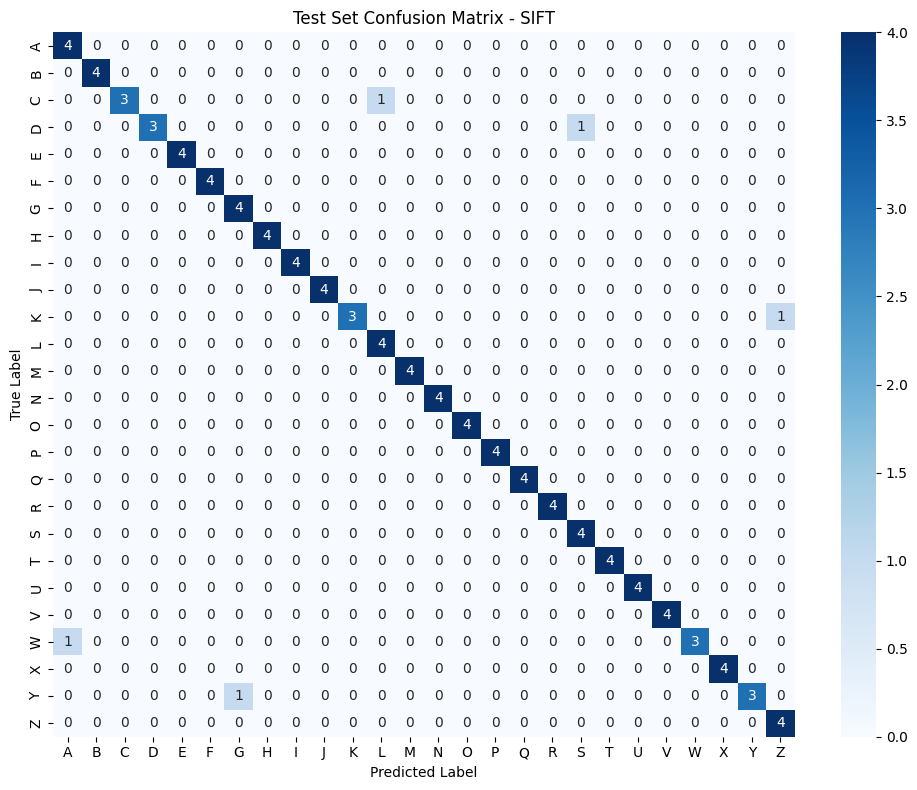


FINAL TEST SET RESULTS: RootSIFT
Test Accuracy: 0.9712

Classification Report:
              precision    recall  f1-score   support

           A       1.00      1.00      1.00         4
           B       1.00      0.75      0.86         4
           C       1.00      0.75      0.86         4
           D       1.00      1.00      1.00         4
           E       1.00      1.00      1.00         4
           F       1.00      1.00      1.00         4
           G       1.00      1.00      1.00         4
           H       1.00      1.00      1.00         4
           I       1.00      1.00      1.00         4
           J       1.00      1.00      1.00         4
           K       1.00      1.00      1.00         4
           L       0.80      1.00      0.89         4
           M       1.00      1.00      1.00         4
           N       1.00      1.00      1.00         4
           O       1.00      1.00      1.00         4
           P       1.00      1.00      1.00         4
 

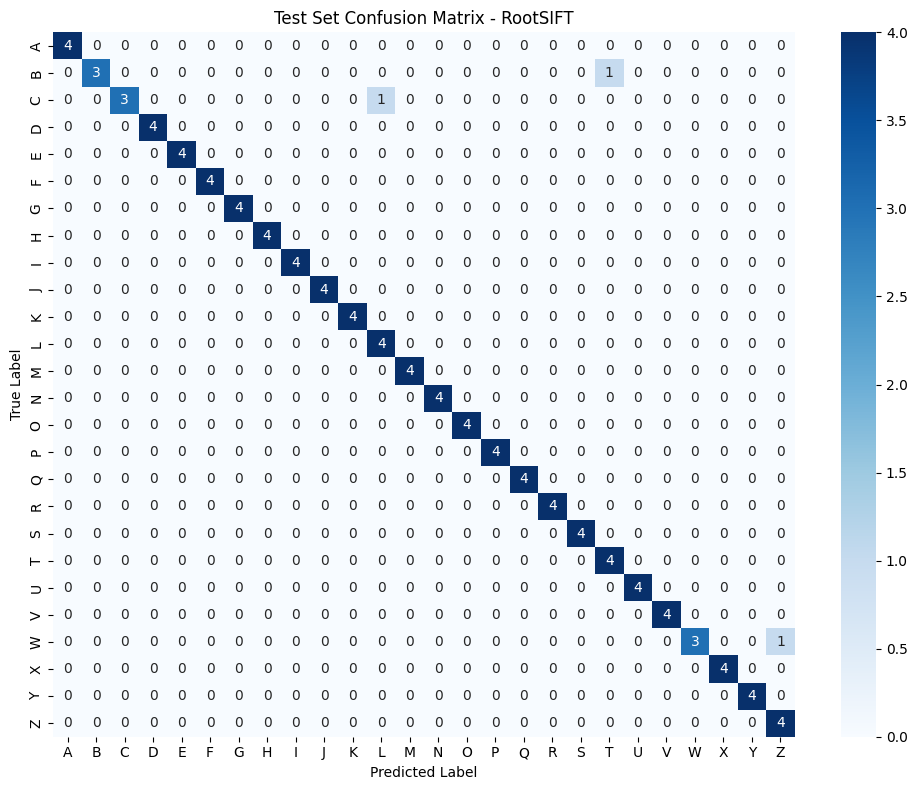


FINAL TEST SET RESULTS: AKAZE
Test Accuracy: 0.9519

Classification Report:
              precision    recall  f1-score   support

           A       0.80      1.00      0.89         4
           B       0.80      1.00      0.89         4
           C       1.00      1.00      1.00         4
           D       1.00      0.75      0.86         4
           E       1.00      1.00      1.00         4
           F       0.67      0.50      0.57         4
           G       1.00      1.00      1.00         4
           H       1.00      1.00      1.00         4
           I       1.00      1.00      1.00         4
           J       1.00      1.00      1.00         4
           K       0.75      0.75      0.75         4
           L       1.00      1.00      1.00         4
           M       1.00      1.00      1.00         4
           N       1.00      1.00      1.00         4
           O       1.00      1.00      1.00         4
           P       0.80      1.00      0.89         4
    

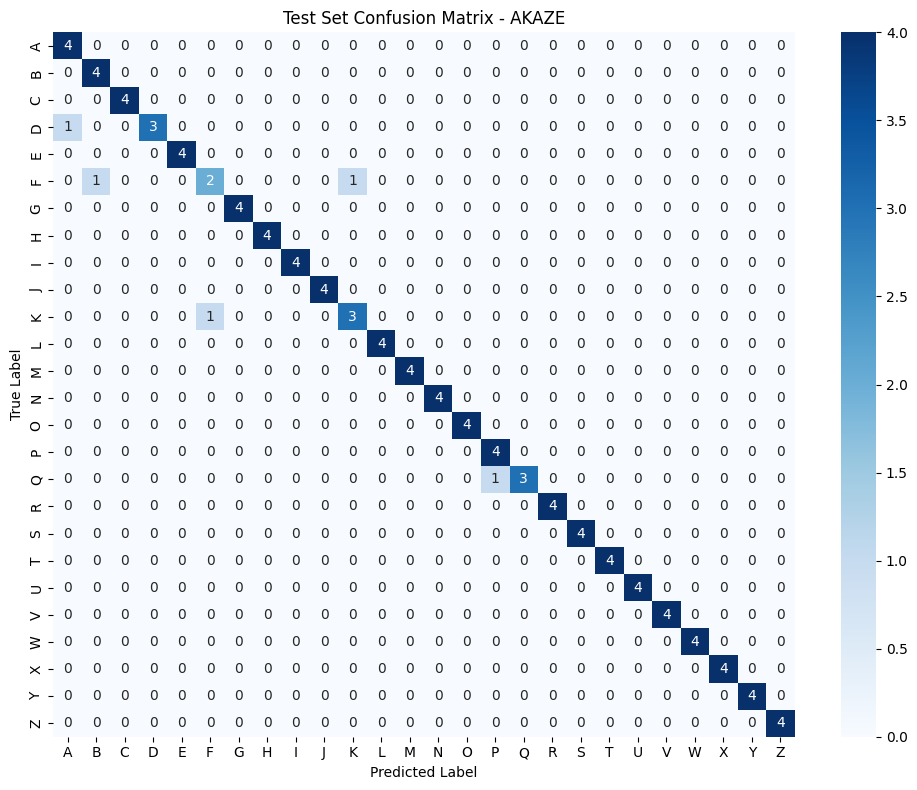


FINAL TEST SET RESULTS: ORB
Test Accuracy: 0.9423

Classification Report:
              precision    recall  f1-score   support

           A       1.00      1.00      1.00         4
           B       1.00      1.00      1.00         4
           C       1.00      0.75      0.86         4
           D       0.80      1.00      0.89         4
           E       1.00      0.75      0.86         4
           F       1.00      0.50      0.67         4
           G       1.00      1.00      1.00         4
           H       1.00      0.75      0.86         4
           I       1.00      1.00      1.00         4
           J       1.00      1.00      1.00         4
           K       1.00      1.00      1.00         4
           L       1.00      1.00      1.00         4
           M       1.00      1.00      1.00         4
           N       1.00      1.00      1.00         4
           O       1.00      1.00      1.00         4
           P       1.00      1.00      1.00         4
      

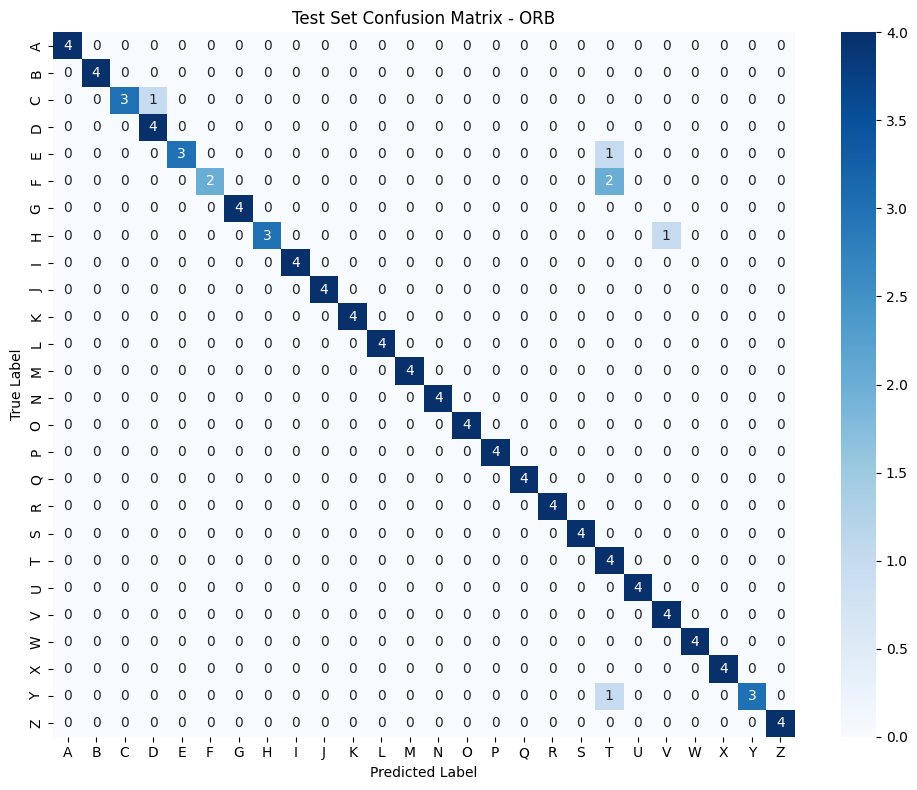


FINAL TEST SET RESULTS: HOG
Test Accuracy: 0.9423

Classification Report:
              precision    recall  f1-score   support

           A       1.00      1.00      1.00         4
           B       1.00      1.00      1.00         4
           C       1.00      0.75      0.86         4
           D       0.80      1.00      0.89         4
           E       1.00      1.00      1.00         4
           F       1.00      1.00      1.00         4
           G       1.00      1.00      1.00         4
           H       0.80      1.00      0.89         4
           I       1.00      1.00      1.00         4
           J       1.00      1.00      1.00         4
           K       1.00      1.00      1.00         4
           L       1.00      1.00      1.00         4
           M       1.00      1.00      1.00         4
           N       1.00      0.75      0.86         4
           O       1.00      1.00      1.00         4
           P       1.00      0.75      0.86         4
      

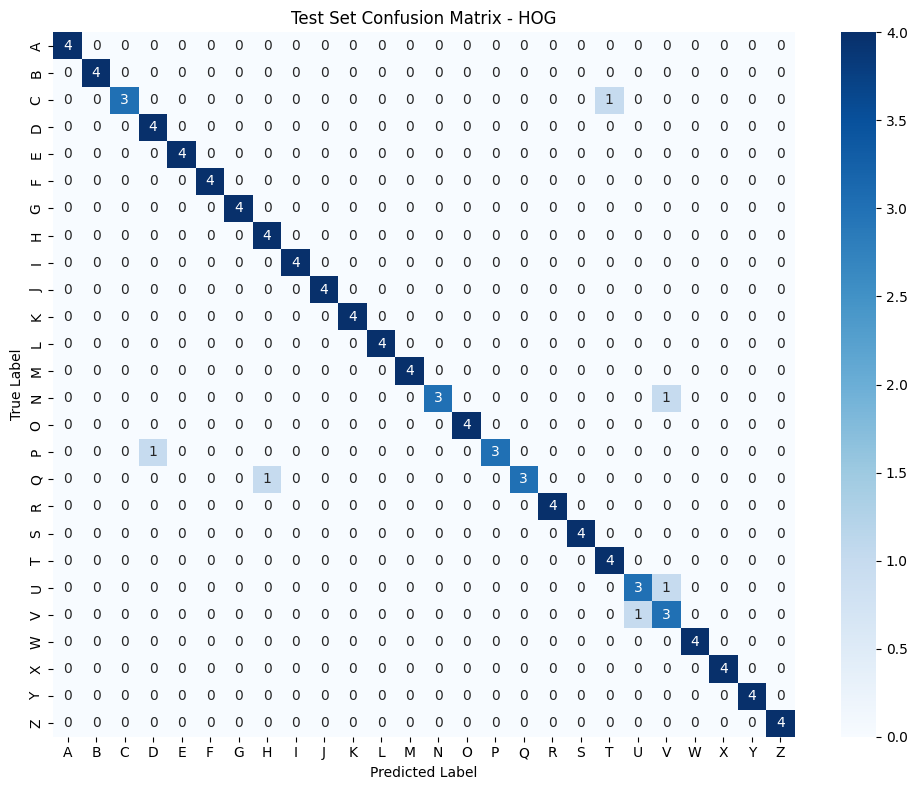


FINAL TEST SET RESULTS: LBP
Test Accuracy: 0.2308

Classification Report:
              precision    recall  f1-score   support

           A       1.00      0.75      0.86         4
           B       0.00      0.00      0.00         4
           C       0.00      0.00      0.00         4
           D       0.00      0.00      0.00         4
           E       0.50      1.00      0.67         4
           F       0.00      0.00      0.00         4
           G       0.00      0.00      0.00         4
           H       0.00      0.00      0.00         4
           I       0.00      0.00      0.00         4
           J       0.25      0.25      0.25         4
           K       0.00      0.00      0.00         4
           L       0.08      0.25      0.12         4
           M       0.40      1.00      0.57         4
           N       0.06      0.25      0.10         4
           O       0.00      0.00      0.00         4
           P       0.50      1.00      0.67         4
      

c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
c:\Users\ac24-2\AppData\Local\anaconda3\envs\Computer_Vision\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavio

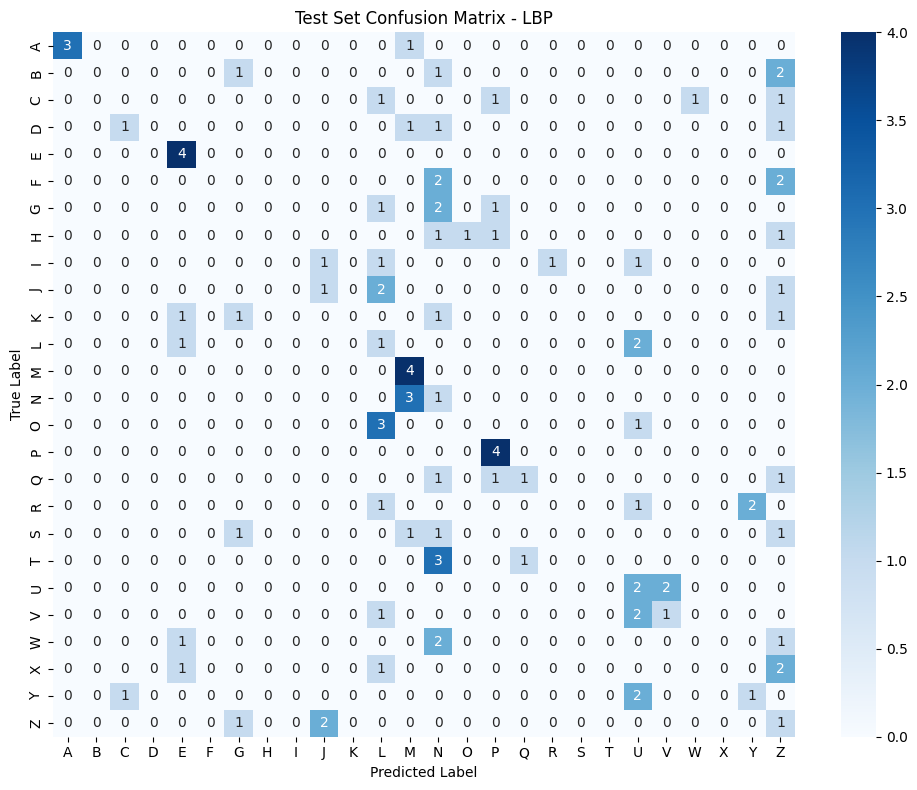

In [207]:
accuracy_list = []

def evaluate_on_test_set(best_model, best_scaler, best_kmeans, desc_name):
    X_test_features = []
    
    for img in X_test:
        if DESCRIPTORS[desc_name]['type'] == 'keypoint':
            _, desc = DESCRIPTORS[desc_name]['descriptor'].detectAndCompute(img, None)
            hist = create_histogram(desc, best_kmeans, N_CLUSTERS)
            X_test_features.append(hist)
        else:
            feat = DESCRIPTORS[desc_name]['descriptor'].compute(img)
            X_test_features.append(feat)
    
    X_test_features = np.array(X_test_features)
    X_test_scaled = best_scaler.transform(X_test_features)
    
    y_pred = best_model.predict(X_test_scaled)
    test_accuracy = accuracy_score(y_test, y_pred)
    
    print(f"\n{'='*60}")
    print(f"FINAL TEST SET RESULTS: {desc_name}")
    print(f"{'='*60}")
    print(f"Test Accuracy: {test_accuracy:.4f}")
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred, target_names=CLASSES))
    
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=CLASSES, yticklabels=CLASSES)
    plt.title(f'Test Set Confusion Matrix - {desc_name}')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.tight_layout()
    plt.savefig(f'test_confusion_matrix_{desc_name.lower()}.png', dpi=300)
    plt.show()
    
    return test_accuracy

for desc_name in DESCRIPTORS.keys():
    best_model = best_models[desc_name][18]['model']
    best_scaler = best_models[desc_name][18]['scaler']
    best_kmeans = best_models[desc_name][18]['kmeans']
    
    test_acc = evaluate_on_test_set(best_model, best_scaler, best_kmeans, desc_name)
    accuracy_list.append(test_acc)

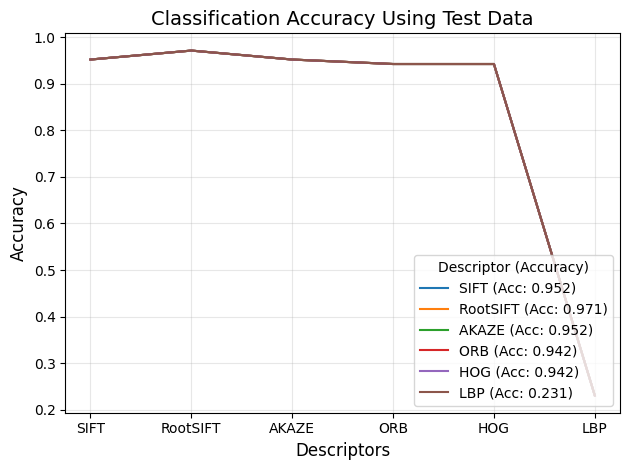

In [220]:
for idx, desc_name in enumerate(DESCRIPTORS.keys()):
    plt.plot(DESCRIPTORS.keys(), accuracy_list, label=f'{desc_name} (Acc: {accuracy_list[idx]:.3f})')

plt.title('Classification Accuracy Using Test Data', fontsize=14)
plt.xlabel('Descriptors', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)

plt.grid(True, alpha=0.3)
plt.legend(loc='lower right', fontsize=10, title='Descriptor (Accuracy)')
plt.tight_layout()
plt.savefig('accuracy_test_data.png', dpi=300, bbox_inches='tight')
plt.show()

## 8. Visualization of Cross Validation Result

### Line Plot: Accuracy vs Number of Training Samples

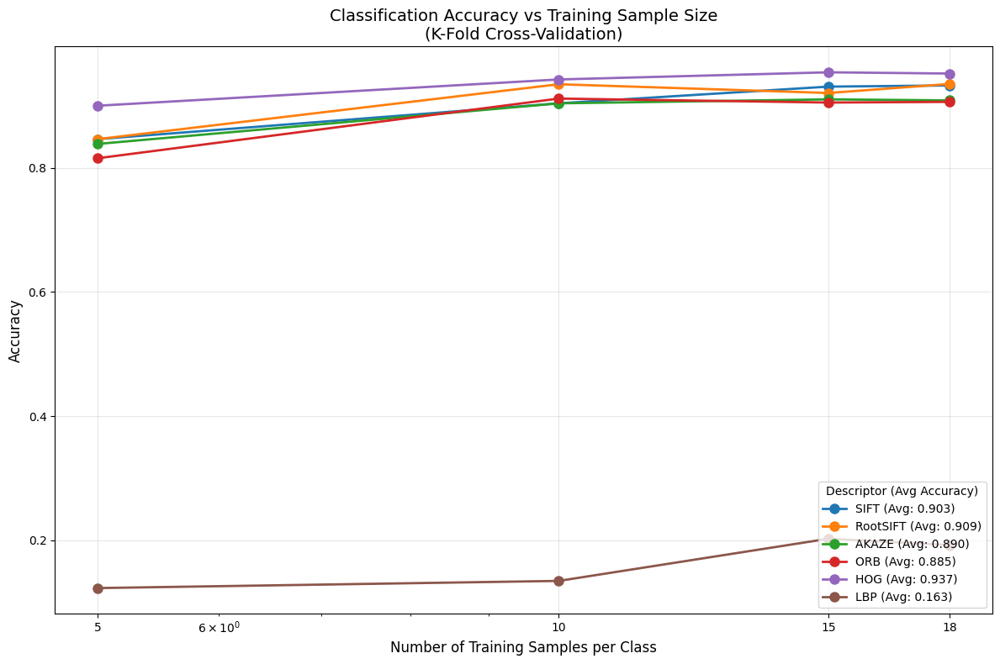

In [ ]:
COLORS = {
    'SIFT': '#1f77b4',     
    'RootSIFT': '#ff7f0e',  
    'AKAZE': '#2ca02c',     
    'ORB': '#d62728',     
    'HOG': '#9467bd',       
    'LBP': '#8c564b',       
}

full_samples_per_class = len(all_labels) // NUM_CLASSES
numeric_sample_sizes = [s if s != 'full' else full_samples_per_class for s in SAMPLE_SIZES]

plt.figure(figsize=(12, 8))

for desc_name in DESCRIPTORS.keys():
    means = []
    stds = []
    
    for sample_size in SAMPLE_SIZES:
        res = results[desc_name][sample_size]
        means.append(res['mean_accuracy'])
        stds.append(res['std_accuracy'])
    
    means = np.array(means)
    stds = np.array(stds)
    
    avg_accuracy = np.mean(means)
    
    plt.plot(numeric_sample_sizes, means, 'o-', color=COLORS[desc_name], 
             linewidth=2, markersize=8, 
             label=f'{desc_name} (Avg: {avg_accuracy:.3f})')

plt.xlabel('Number of Training Samples per Class', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.title('Classification Accuracy vs Training Sample Size\n(K-Fold Cross-Validation)', fontsize=14)
plt.legend(loc='lower right', fontsize=10, title='Descriptor (Avg Accuracy)')
plt.grid(True, alpha=0.3)
plt.xscale('log')

plt.tight_layout()
plt.savefig('accuracy_vs_samples_lineplot.png', dpi=300, bbox_inches='tight')
plt.show()

### Bar Plot: Descriptor Comparison (Mean Accuracy with Standard Deviation)

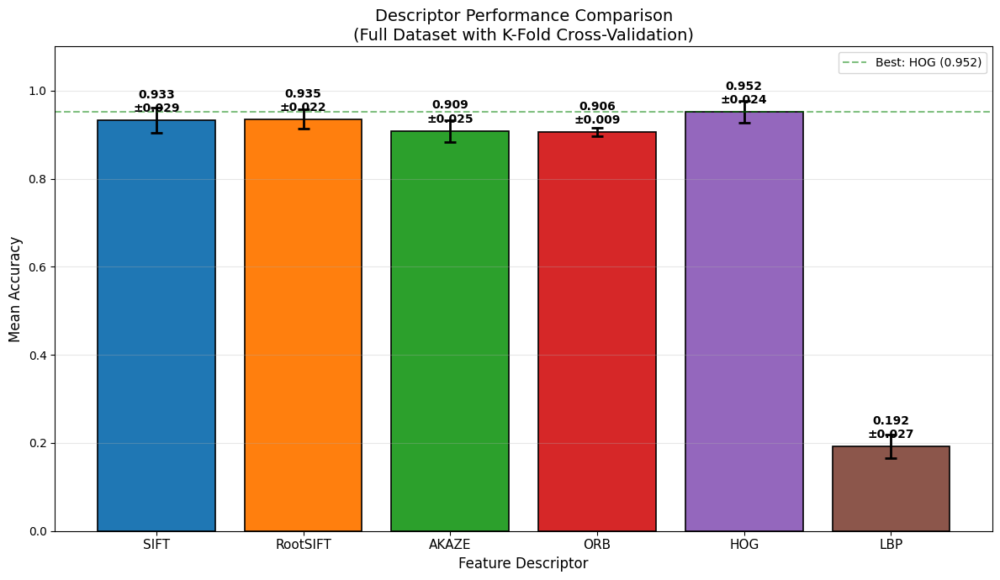

In [187]:
desc_names = list(DESCRIPTORS.keys())
overall_means = []
overall_stds = []

for desc_name in desc_names:
    res = results[desc_name][18]
    overall_means.append(res['mean_accuracy'])
    overall_stds.append(res['std_accuracy'])

fig, ax = plt.subplots(figsize=(12, 7))

x_pos = np.arange(len(desc_names))
bars = ax.bar(x_pos, overall_means, yerr=overall_stds, 
              color=[COLORS[name] for name in desc_names],
              capsize=5, edgecolor='black', linewidth=1.2,
              error_kw={'elinewidth': 2, 'capthick': 2})

for bar, mean, std in zip(bars, overall_means, overall_stds):
    height = bar.get_height()
    ax.annotate(f'{mean:.3f}\n±{std:.3f}',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 5),
                textcoords="offset points",
                ha='center', va='bottom', fontsize=10, fontweight='bold')

ax.set_xlabel('Feature Descriptor', fontsize=12)
ax.set_ylabel('Mean Accuracy', fontsize=12)
ax.set_title('Descriptor Performance Comparison\n(Full Dataset with K-Fold Cross-Validation)', fontsize=14)
ax.set_xticks(x_pos)
ax.set_xticklabels(desc_names, fontsize=11)
ax.set_ylim(0, 1.1)
ax.grid(axis='y', alpha=0.3)

best_idx = np.argmax(overall_means)
ax.axhline(y=overall_means[best_idx], color='green', linestyle='--', alpha=0.5, 
           label=f'Best: {desc_names[best_idx]} ({overall_means[best_idx]:.3f})')
ax.legend(loc='upper right')

plt.tight_layout()
plt.savefig('descriptor_comparison_barplot.png', dpi=300, bbox_inches='tight')
plt.show()

### Heatmap: Accuracy by Descriptor and Sample Size

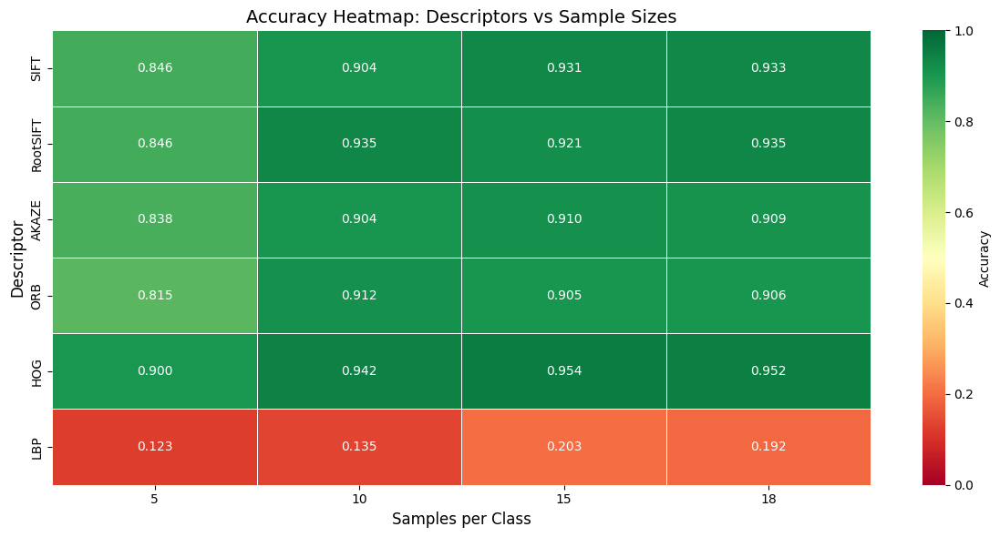

In [188]:
heatmap_data = []
sample_labels = [str(s) if s != 'full' else 'Full' for s in SAMPLE_SIZES]

for desc_name in desc_names:
    row = [results[desc_name][s]['mean_accuracy'] for s in SAMPLE_SIZES]
    heatmap_data.append(row)

heatmap_df = pd.DataFrame(heatmap_data, index=desc_names, columns=sample_labels)

plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_df, annot=True, fmt='.3f', cmap='RdYlGn', 
            vmin=0, vmax=1, linewidths=0.5, cbar_kws={'label': 'Accuracy'})
plt.xlabel('Samples per Class', fontsize=12)
plt.ylabel('Descriptor', fontsize=12)
plt.title('Accuracy Heatmap: Descriptors vs Sample Sizes', fontsize=14)
plt.tight_layout()
plt.savefig('accuracy_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

## 7. Save Best Models and Results

In [227]:
os.makedirs('models', exist_ok=True)

def save_model(name, model_dict, results_info=None):
    model_data = {
        'svc': model_dict['model'],
        'scaler': model_dict['scaler'],
        'kmeans': model_dict['kmeans'],
        'descriptor_name': name,
        'results': results_info
    }
    filepath = f'models/rps_classifier_{name.lower()}_best.pkl'
    with open(filepath, 'wb') as f:
        pickle.dump(model_data, f)
    print(f" {name}: {results_info['mean_accuracy']:.4f} ± {results_info['std_accuracy']:.4f}")
    return filepath

saved_models = {}
print("\nSaving best models (trained on full dataset):\n")

for desc_name in DESCRIPTORS.keys():
    model_dict = best_models[desc_name][18]
    results_info = results[desc_name][18]
    
    if model_dict['model'] is not None:
        filepath = save_model(desc_name, model_dict, results_info)
        saved_models[desc_name] = filepath

print(f"\n✓ {len(saved_models)} models saved to 'models/' directory")


Saving best models (trained on full dataset):

 SIFT: 0.9327 ± 0.0292
 RootSIFT: 0.9351 ± 0.0224
 AKAZE: 0.9086 ± 0.0250
 ORB: 0.9062 ± 0.0092
 HOG: 0.9518 ± 0.0241
 LBP: 0.1923 ± 0.0270

✓ 6 models saved to 'models/' directory


In [149]:
def load_model(filename):
    try:
        with open(filename, 'rb') as f:
            model_data = pickle.load(f)
        
        svc = model_data['svc']
        scaler = model_data.get('scaler', None)
        kmeans = model_data.get('kmeans', None)
        desc_name = model_data.get('descriptor_name', 'Unknown')
        
        print(f"Loaded model: {desc_name}")
        return svc, scaler, kmeans
    except Exception as e:
        print(f"Error loading model: {e}")
        return None, None, None

## 8. Classify New Images

In [ ]:
def classify_image(image_path, descriptor, scaler, kmeans=None, svc=None, local_descriptor=True):
    img = cv2.imread(image_path)
    
    img_resized = cv2.resize(img, (256, 256))
    gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
    gray_blur = cv2.GaussianBlur(gray, (3, 3), 0)

    if local_descriptor:
        _, desc = descriptor.detectAndCompute(gray_blur, None)
        hist = create_histogram(desc, kmeans, N_CLUSTERS)
    else:
        hist = descriptor.compute(gray_blur)

    hist_scaled = scaler.transform([hist])
    probs = svc.predict_proba(hist_scaled)[0]
    pred_idx = np.argmax(probs)
    pred_class = CLASSES[pred_idx]
    confidence = probs[pred_idx]

    plt.figure(figsize=(6, 6))
    plt.imshow(cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB))
    plt.title(f"{pred_class.upper()} ({confidence:.1%})", fontsize=14)
    plt.axis('off')
    plt.show()
    
    print(f"  Probabilities: ", end="")
    for i, cls in enumerate(CLASSES):
        print(f"{cls}={probs[i]:.1%} ", end="")
    print()

    return pred_class, confidence

In [151]:
svc_sift, scaler_sift, kmeans_sift = load_model('models/rps_classifier_sift_best.pkl')
svc_rootsift, scaler_rootsift, kmeans_rootsift = load_model('models/rps_classifier_rootsift_best.pkl')
svc_akaze, scaler_akaze, kmeans_akaze = load_model('models/rps_classifier_akaze_best.pkl')
svc_orb, scaler_orb, kmeans_orb = load_model('models/rps_classifier_orb_best.pkl')
svc_hog, scaler_hog, _ = load_model('models/rps_classifier_hog_best.pkl')
svc_lbp, scaler_lbp, _ = load_model('models/rps_classifier_lbp_best.pkl')

Loaded model: SIFT
Loaded model: RootSIFT
Loaded model: AKAZE
Loaded model: ORB
Loaded model: HOG
Loaded model: LBP


In [224]:
def show_keypoints(path):
    img = cv2.imread(path)

    resized_img = resize_image(img)
    kps, desc = rootsift.detectAndCompute(resized_img, None)

    img_test = cv2.drawKeypoints(resized_img, kps, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    plt.figure(figsize=(8, 6))
    plt.imshow(cv2.cvtColor(img_test, cv2.COLOR_BGR2RGB))
    plt.title("RootSIFT Keypoints")
    plt.axis('off')
    plt.show()


Testing: IMG20251215100521.jpg


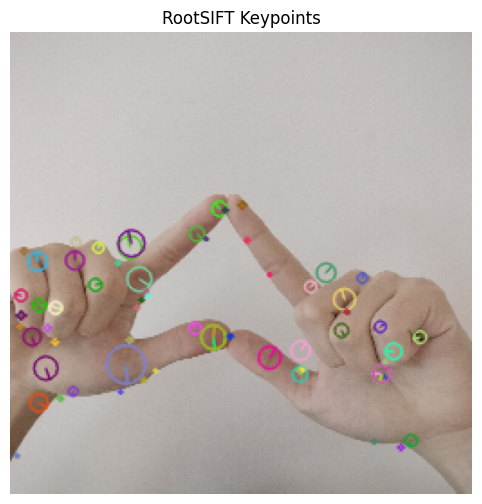

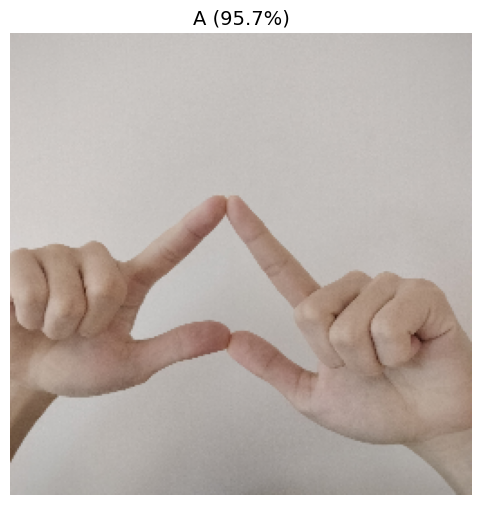

  Probabilities: A=95.7% B=0.4% C=0.2% D=0.2% E=0.0% F=0.2% G=0.1% H=0.1% I=0.1% J=0.1% K=0.1% L=0.0% M=0.1% N=0.3% O=0.1% P=0.2% Q=0.3% R=0.1% S=0.4% T=0.8% U=0.0% V=0.3% W=0.1% X=0.1% Y=0.1% Z=0.1% 

Testing: IMG20251215102610.jpg


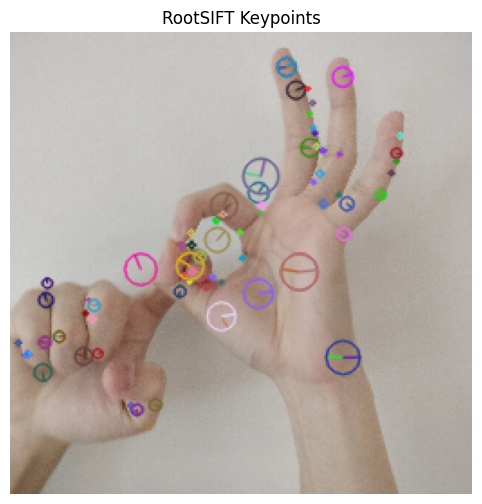

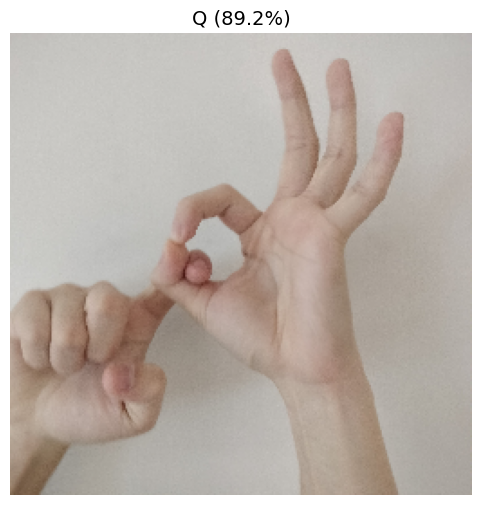

  Probabilities: A=0.8% B=0.8% C=0.2% D=0.1% E=0.1% F=0.7% G=0.1% H=0.1% I=0.9% J=0.3% K=0.1% L=0.2% M=1.4% N=1.8% O=0.4% P=0.3% Q=89.2% R=0.1% S=0.3% T=0.4% U=0.1% V=0.6% W=0.3% X=0.2% Y=0.2% Z=0.3% 

Testing: IMG20251215144620.jpg


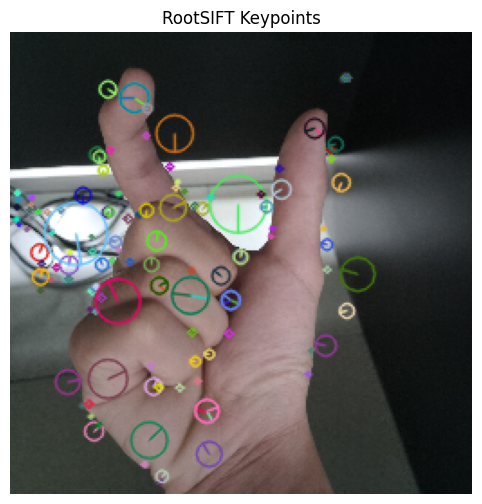

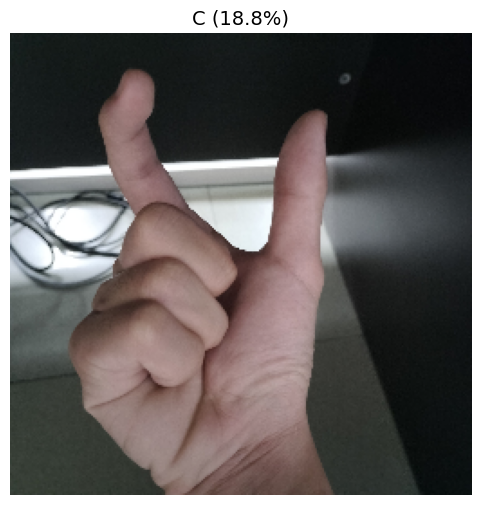

  Probabilities: A=1.1% B=3.2% C=18.8% D=1.8% E=0.2% F=8.2% G=0.4% H=2.5% I=1.8% J=1.0% K=0.7% L=3.6% M=0.8% N=0.8% O=18.3% P=0.4% Q=1.3% R=6.8% S=4.1% T=1.3% U=6.6% V=7.4% W=1.1% X=1.2% Y=2.5% Z=3.9% 

Testing: IMG20251215144652.jpg


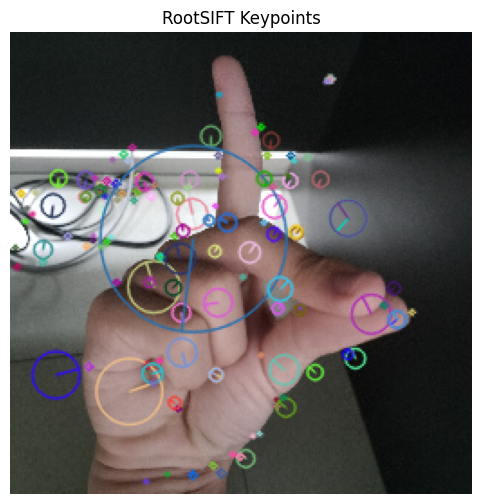

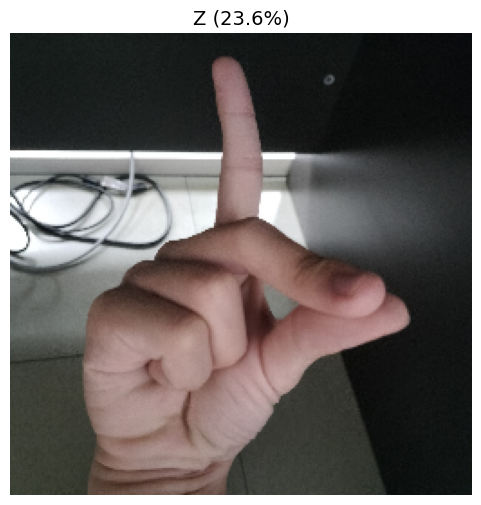

  Probabilities: A=6.6% B=5.5% C=3.7% D=2.5% E=0.2% F=21.1% G=0.2% H=2.0% I=0.4% J=0.9% K=0.5% L=1.3% M=0.4% N=0.4% O=4.3% P=0.8% Q=0.5% R=6.3% S=3.5% T=4.2% U=6.3% V=2.3% W=0.6% X=0.9% Y=1.0% Z=23.6% 

Testing: IMG20251215144705.jpg


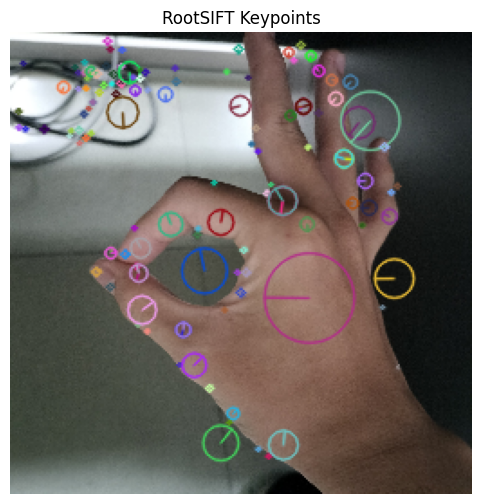

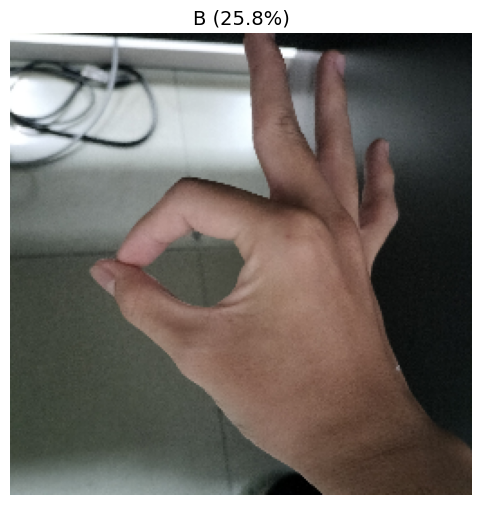

  Probabilities: A=13.5% B=25.8% C=4.3% D=5.0% E=0.3% F=12.3% G=0.6% H=2.4% I=2.1% J=1.7% K=0.4% L=1.2% M=0.6% N=1.1% O=3.2% P=0.9% Q=3.7% R=1.3% S=3.0% T=2.9% U=1.5% V=2.4% W=0.3% X=0.7% Y=1.9% Z=6.9% 

Testing: IMG20251215144841.jpg


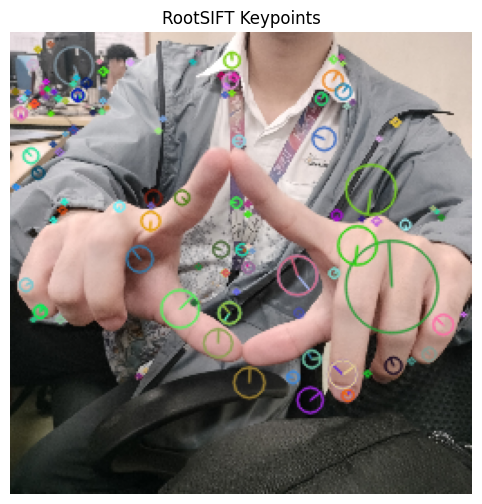

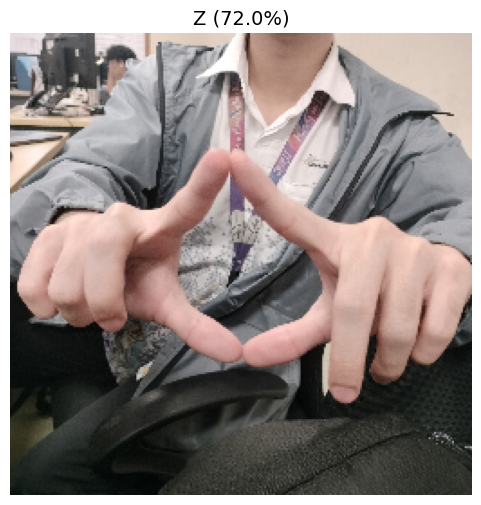

  Probabilities: A=4.1% B=4.6% C=0.2% D=0.3% E=0.0% F=0.9% G=0.1% H=0.8% I=1.8% J=1.0% K=0.6% L=0.5% M=0.8% N=0.3% O=0.8% P=0.3% Q=4.3% R=1.2% S=0.6% T=1.5% U=0.4% V=1.1% W=0.4% X=0.2% Y=1.2% Z=72.0% 

Testing: IMG20251215144919.jpg


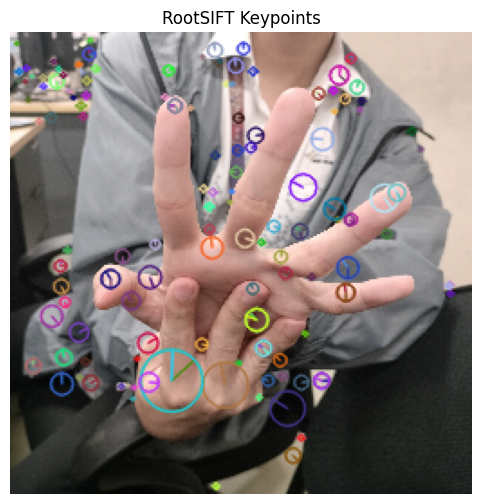

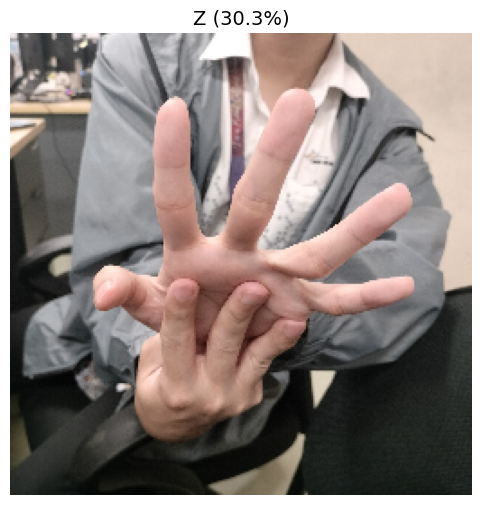

  Probabilities: A=6.9% B=23.9% C=0.3% D=0.3% E=0.1% F=7.7% G=0.2% H=2.7% I=4.0% J=1.3% K=0.7% L=0.2% M=1.0% N=2.1% O=1.5% P=0.7% Q=9.5% R=0.4% S=0.4% T=0.5% U=0.6% V=2.0% W=0.5% X=0.7% Y=1.5% Z=30.3% 

Testing: IMG20251215144948.jpg


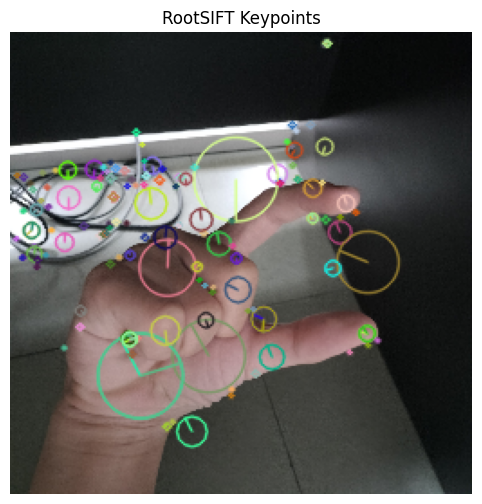

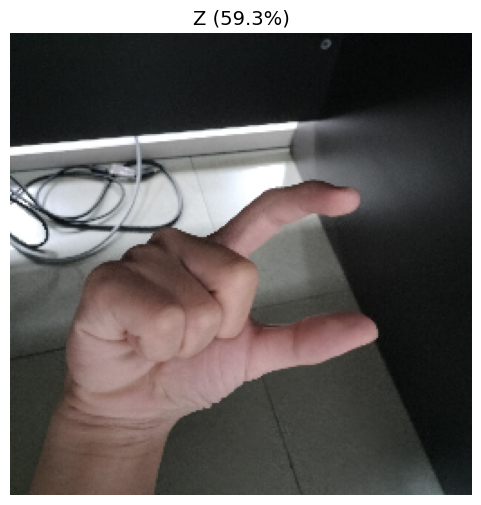

  Probabilities: A=4.0% B=7.1% C=0.7% D=1.0% E=0.1% F=4.8% G=0.3% H=5.9% I=0.7% J=0.8% K=0.9% L=0.4% M=0.4% N=0.7% O=3.0% P=0.4% Q=0.6% R=1.3% S=0.5% T=0.9% U=1.5% V=2.9% W=0.5% X=0.4% Y=0.8% Z=59.3% 

Testing: IMG20251215145002.jpg


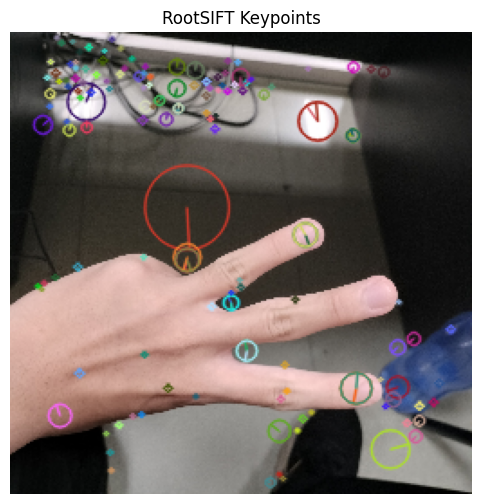

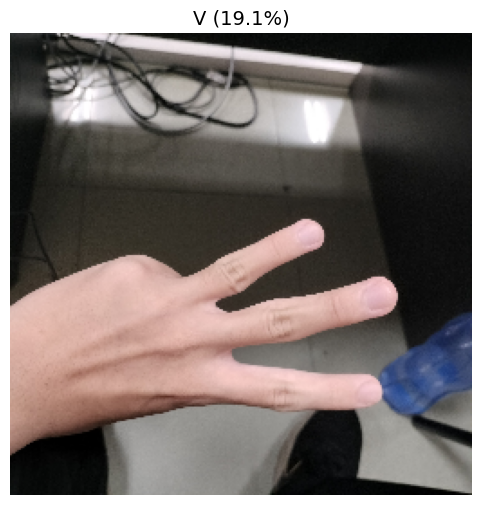

  Probabilities: A=10.4% B=4.8% C=10.3% D=3.3% E=0.8% F=10.3% G=0.5% H=2.8% I=0.8% J=0.7% K=0.4% L=1.6% M=0.3% N=0.5% O=13.2% P=0.3% Q=0.4% R=2.1% S=5.1% T=0.8% U=7.1% V=19.1% W=0.3% X=0.2% Y=0.7% Z=2.9% 

Testing: IMG20251216212711.jpg


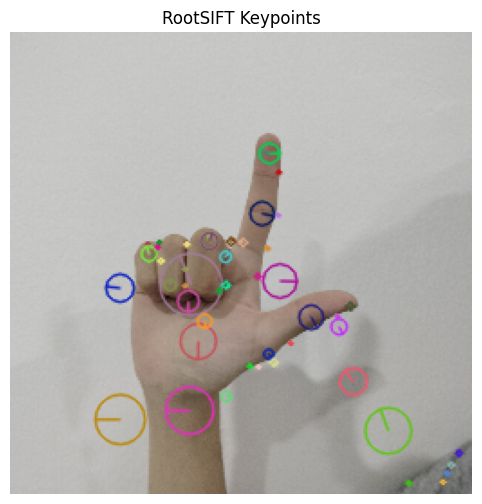

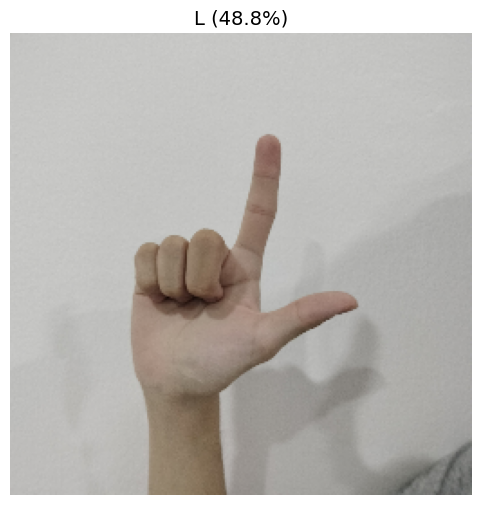

  Probabilities: A=2.6% B=1.2% C=1.2% D=0.1% E=0.1% F=1.0% G=0.4% H=0.4% I=1.7% J=18.6% K=0.2% L=48.8% M=0.1% N=0.2% O=0.2% P=0.2% Q=0.1% R=1.7% S=4.7% T=0.7% U=5.7% V=1.6% W=5.7% X=0.7% Y=1.4% Z=0.6% 

Testing: IMG20251216212714.jpg


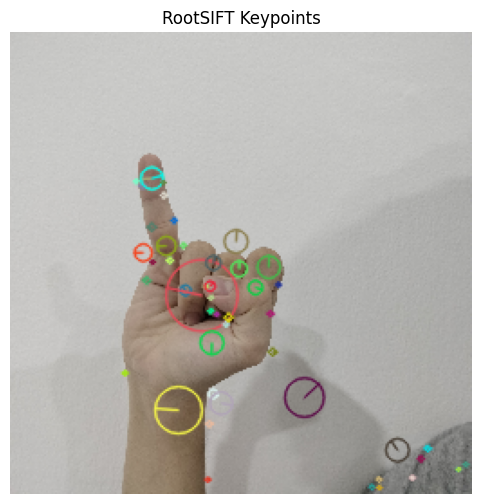

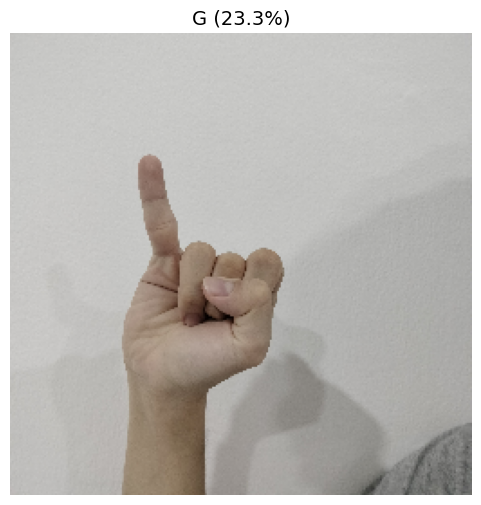

  Probabilities: A=1.9% B=2.0% C=1.2% D=2.1% E=0.3% F=1.3% G=23.3% H=7.7% I=1.7% J=22.3% K=1.5% L=1.5% M=0.4% N=1.0% O=2.2% P=0.3% Q=0.2% R=2.7% S=2.6% T=1.4% U=2.7% V=3.3% W=3.1% X=2.6% Y=9.8% Z=0.9% 

Testing: IMG20251216212724.jpg


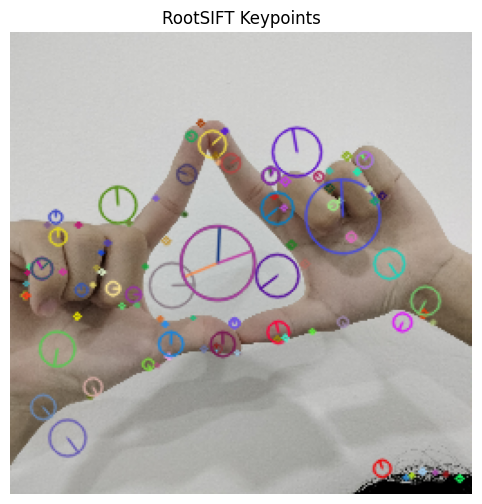

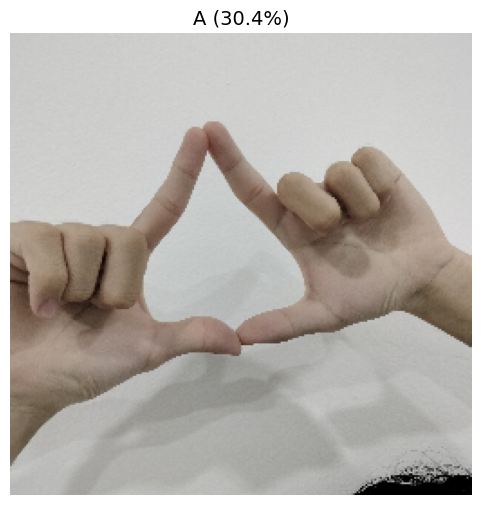

  Probabilities: A=30.4% B=5.1% C=16.8% D=4.9% E=0.2% F=2.3% G=2.7% H=1.3% I=0.8% J=1.0% K=0.5% L=3.9% M=0.3% N=0.4% O=1.7% P=0.5% Q=0.4% R=4.0% S=7.4% T=1.2% U=3.9% V=6.4% W=1.9% X=0.4% Y=0.4% Z=1.1% 

Testing: IMG20251216212739.jpg


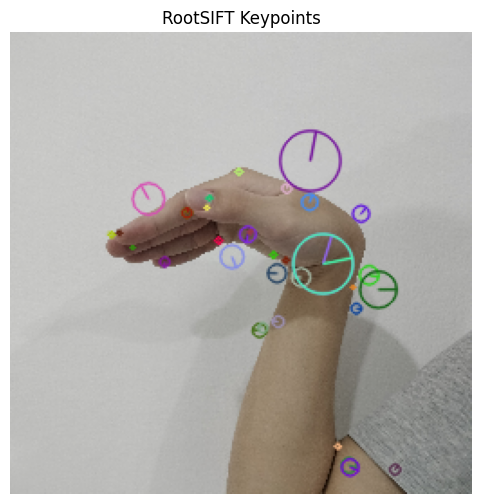

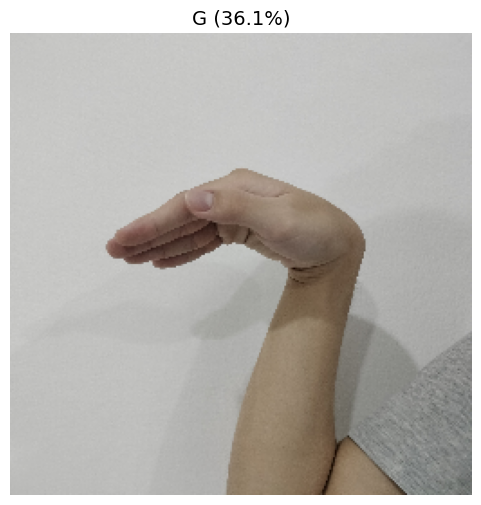

  Probabilities: A=1.5% B=1.3% C=5.7% D=0.9% E=0.5% F=0.8% G=36.1% H=1.5% I=1.4% J=1.0% K=1.2% L=2.9% M=0.1% N=0.2% O=3.1% P=1.0% Q=0.2% R=4.9% S=1.2% T=3.3% U=4.8% V=18.0% W=0.4% X=0.7% Y=1.1% Z=6.2% 

Testing: IMG20251216212741.jpg


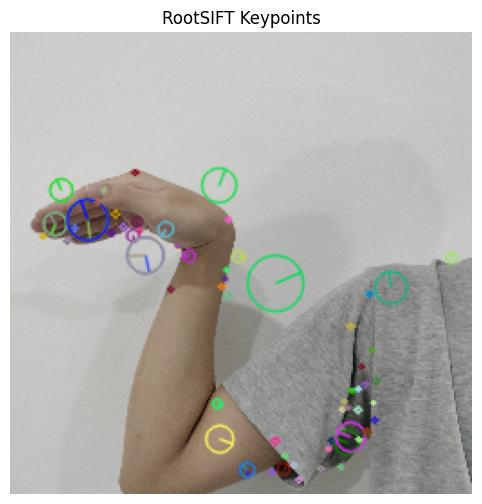

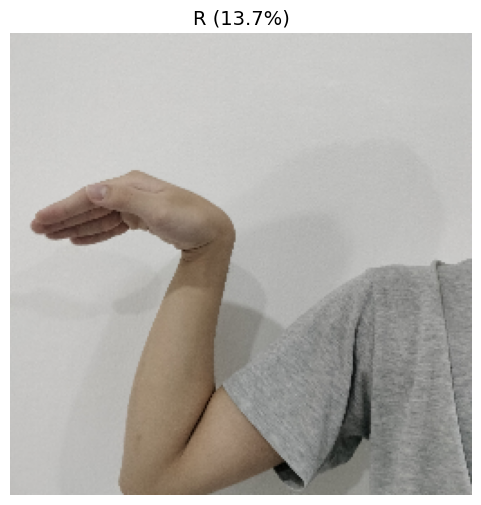

  Probabilities: A=5.0% B=4.0% C=11.0% D=3.4% E=1.2% F=3.2% G=6.5% H=3.1% I=0.7% J=1.1% K=1.1% L=1.0% M=1.3% N=4.9% O=4.4% P=0.8% Q=0.6% R=13.7% S=3.1% T=4.1% U=11.3% V=8.4% W=0.7% X=0.5% Y=2.7% Z=2.3% 

Testing: IMG20251216212835.jpg


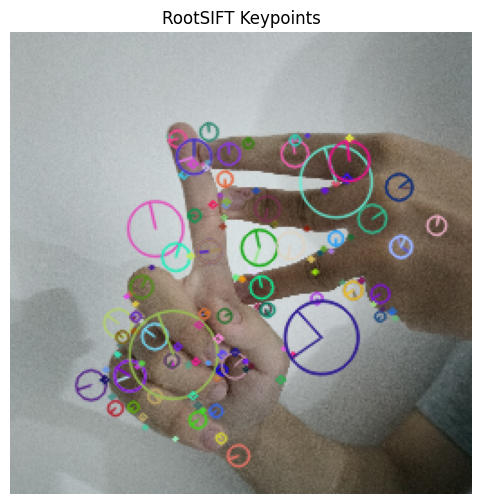

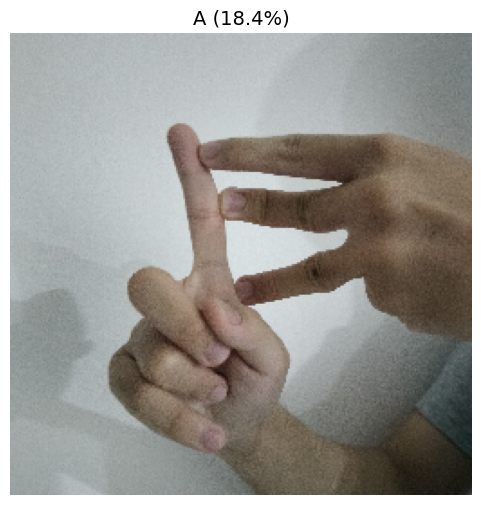

  Probabilities: A=18.4% B=9.1% C=4.7% D=4.9% E=0.1% F=5.6% G=0.8% H=0.5% I=1.3% J=5.6% K=0.8% L=0.7% M=0.7% N=1.1% O=3.4% P=0.8% Q=2.7% R=4.2% S=5.3% T=8.8% U=1.0% V=3.9% W=1.2% X=0.5% Y=1.7% Z=12.6% 

Testing: IMG20251216212849.jpg


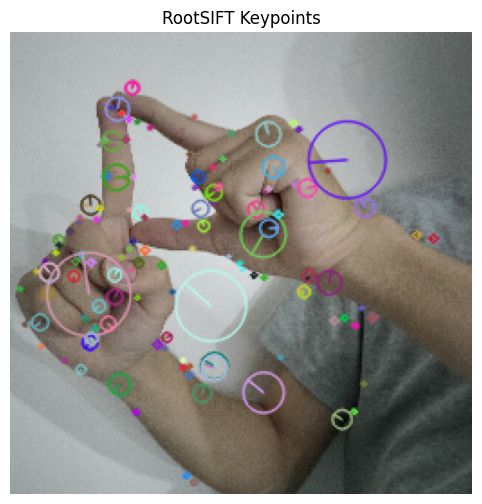

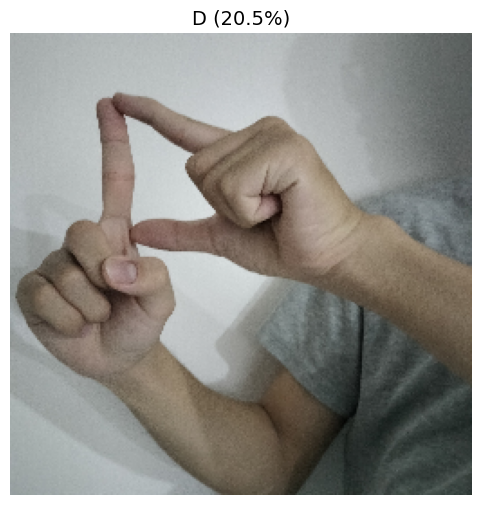

  Probabilities: A=10.0% B=6.8% C=15.3% D=20.5% E=0.1% F=13.3% G=0.3% H=0.5% I=0.4% J=0.8% K=0.2% L=1.1% M=0.1% N=0.2% O=6.5% P=0.4% Q=0.3% R=4.0% S=7.0% T=2.5% U=2.5% V=1.2% W=2.1% X=1.4% Y=0.6% Z=1.9% 

Testing: IMG_20251216_212928.jpg


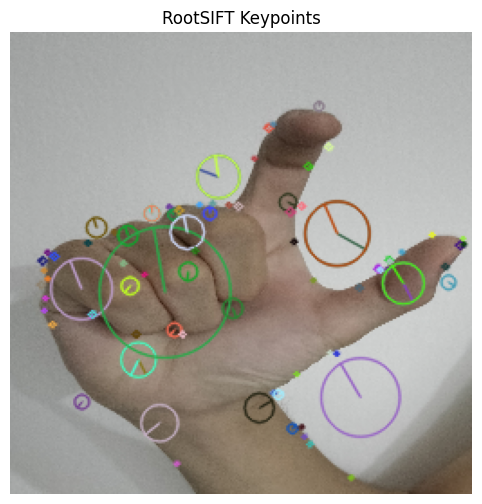

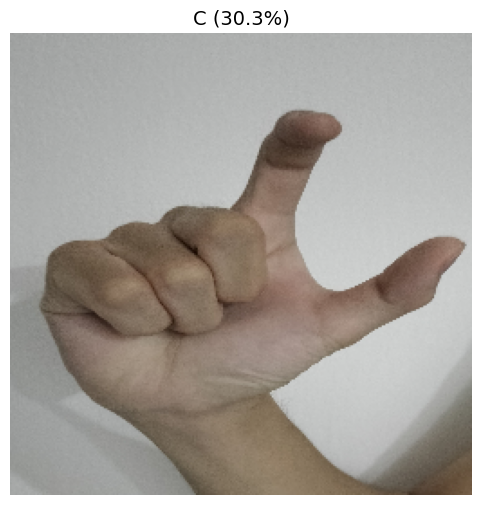

  Probabilities: A=2.6% B=2.7% C=30.3% D=10.5% E=0.7% F=4.4% G=0.8% H=1.6% I=0.4% J=1.0% K=0.2% L=10.6% M=0.3% N=0.3% O=2.0% P=1.0% Q=0.2% R=5.2% S=7.2% T=4.3% U=6.7% V=5.5% W=0.5% X=0.3% Y=0.3% Z=0.4% 

Testing: IMG_20251216_213015.jpg


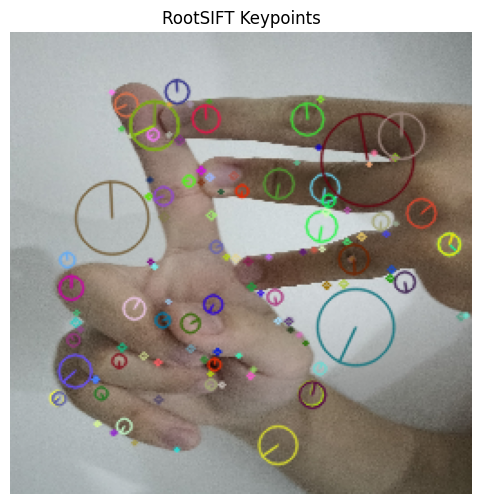

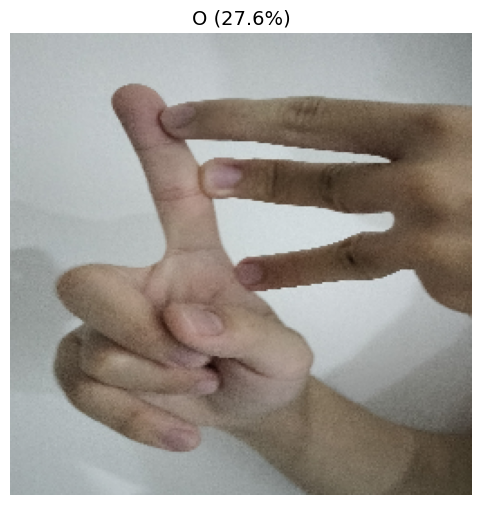

  Probabilities: A=2.8% B=9.8% C=3.8% D=9.3% E=0.7% F=10.5% G=0.7% H=2.6% I=0.6% J=0.8% K=0.4% L=1.1% M=0.5% N=2.0% O=27.6% P=0.5% Q=0.8% R=3.0% S=3.1% T=3.4% U=6.6% V=6.4% W=0.4% X=0.6% Y=1.0% Z=0.9% 


In [225]:
test_path = './test_images/'

for f in os.listdir(test_path):
    filepath = os.path.join(test_path, f)
    if not os.path.isfile(filepath):
        continue
    
    print(f"\nTesting: {f}")
    show_keypoints(filepath)
    classify_image(filepath, descriptor=rootsift, scaler=scaler_rootsift, kmeans=kmeans_rootsift, svc=svc_rootsift)